# Evaluating Tikhonet Trained

In this Notebook we are going to evaluate the performance of a [Tikhonet](https://arxiv.org/pdf/1911.00443.pdf) trained.

## Required Libraries and Functions

In [1]:
%matplotlib inline
import sys
import numpy as np

# Directories and paths
lib_path = '/gpfswork/rech/xdy/uze68md/GitHub/'
data_path = '/gpfswork/rech/xdy/uze68md/data/'
model_dir = '/gpfswork/rech/xdy/uze68md/trained_models/model_meerkat_64/'

# Add library path to PYTHONPATH
path_alphatransform = lib_path+'alpha-transform'
path_score = lib_path+'score'
sys.path.insert(0, path_alphatransform)
sys.path.insert(0, path_score)

# Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import fft
import cadmos_lib as cl
import tensorflow as tf
import galsim
from galsim import Image
import galsim.hsm
import galflow as gf
from galaxy2galaxy import problems
import pickle

# set random seed
tf.random.set_random_seed(2)

# Functions

def ir2tf_simplifie(imp_resp, shape):
    

    dim = 2
    # Zero padding and fill
    irpadded = np.zeros(shape)
    irpadded[tuple([slice(0, s) for s in imp_resp.shape])] = imp_resp
    # Roll for zero convention of the fft to avoid the phase
    # problem. Work with odd and even size.
    for axis, axis_size in enumerate(imp_resp.shape):

        irpadded = np.roll(irpadded,
                           shift=-int(np.floor(axis_size / 2)),
                           axis=axis)

    return fft.rfftn(irpadded, axes=range(-dim, 0))

def laplacian_simplifie(shape):
    
    impr = np.zeros([3,3])
    for dim in range(2):
        idx = tuple([slice(1, 2)] * dim +
                    [slice(None)] +
                    [slice(1, 2)] * (1 - dim))
        impr[idx] = np.array([-1.0,
                              0.0,
                              -1.0]).reshape([-1 if i == dim else 1
                                              for i in range(2)])
    impr[(slice(1, 2), ) * 2] = 4.0
    return ir2tf_simplifie(impr, shape), impr

def laplacian_tf(shape):
    return tf.convert_to_tensor(laplacian_simplifie(shape)[0])

def wiener_tf(image, psf, balance, laplacian=True):
    r"""Applies Wiener filter to image.

    This function takes an image in the direct space and its corresponding PSF in the
    Fourier space and performs a deconvolution using the Wiener Filter.

    Parameters
    ----------
    image   : 2D TensorFlow tensor
        Image in the direct space.
    psf     : 2D TensorFlow tensor
        PSF in the Fourier space (or K space).
    balance : scalar
        Weight applied to regularization.
    laplacian : boolean
        If true the Laplacian regularization is used else the identity regularization 
        is used.

    Returns
    -------
    tuple
        The first element is the filtered image in the Fourier space.
        The second element is the PSF in the Fourier space (also know as the Transfer
        Function).
    """
    trans_func = psf
    if laplacian:
        reg = laplacian_tf(image.shape)
        if psf.shape != reg.shape:
            trans_func = tf.signal.rfft2d(tf.signal.ifftshift(tf.cast(psf, 'float32')))
        else:
            trans_func = psf
    
    arg1 = tf.cast(tf.math.conj(trans_func), 'complex64')
    arg2 = tf.dtypes.cast(tf.math.abs(trans_func),'complex64') ** 2
    arg3 = balance
    if laplacian:
        arg3 *= tf.dtypes.cast(tf.math.abs(laplacian_tf(image.shape)), 'complex64')**2
    wiener_filter = arg1 / (arg2 + arg3)
    
    # Apply wiener in Foutier (or K) space
    wiener_applied = wiener_filter * tf.signal.rfft2d(tf.cast(image, 'float32'))
    
    return wiener_applied, trans_func

def pre_proc_unet(dico):
    r"""Preprocess the data and apply the Tikhonov filter on the input galaxy images.

    This function takes the dictionnary of galaxy images and PSF for the input and
    the target and returns a list containing 2 arrays: an array of galaxy images that
    are the output of the Tikhonov filter and an array of target galaxy images.

    Parameters
    ----------
    dico : dictionnary
        Array_like means all those objects -- lists, nested lists, etc. --
        that can be converted to an array.  We can also refer to
        variables like `var1`.

    Returns
    -------
    list
        list containing 2 arrays: an array of galaxy images that are the output of the
        Tikhonov filter and an array of target galaxy images.

    Example
    -------
    These are written in doctest format, and should illustrate how to
    use the function.

    >>> from galaxy2galaxy import problems # to list avaible problems run problems.available()
    >>> problem128 = problems.problem('attrs2img_cosmos_hst2euclide')
    >>> dset = problem128.dataset(Modes.TRAIN, data_dir='attrs2img_cosmos_hst2euclide')
    >>> dset = dset.map(pre_proc_unet)
    """
    # First, we interpolate the image on a finer grid
    x_interpolant=tf.image.ResizeMethod.BICUBIC
    interp_factor = 2
    Nx = 128
    Ny = 128
    
    dico['inputs'] = tf.image.resize(dico['targets'],
                                  [Nx*interp_factor, Ny*interp_factor],
                                  method=x_interpolant)
    
    # Second, we add noise
    sigma = 7e-4
    noise = tf.random_normal(shape=tf.shape(dico['inputs']), mean=0.0, stddev=sigma, dtype=tf.float32)
    dico['inputs'] = dico['inputs'] + noise
    dico['psf'] = tf.cast(dico['psf'][...,0]/tf.math.reduce_max(dico['psf'][...,0]), dtype=tf.complex64)
    dico['mask'] = tf.identity(dico['psf'])
    dico['inputs'] = tf.signal.rfft2d(dico['inputs'][...,0])
    dico['inputs'] = tf.expand_dims(dico['inputs'], axis=0)
    dico['psf'] = tf.expand_dims(dico['psf'], axis=0)
    dico['inputs'] = gf.kconvolve(dico['inputs'], dico['psf'],
                   interp_factor=interp_factor)[0]
    dico['psf'] = tf.signal.ifftshift(tf.signal.irfft2d(dico['psf'], fft_length=[2*Nx,2*Ny]))
    
    # Third, we normalize the Unet inputs to improve the training
    norm_factor = 5e2
    dico['inputs'] = dico['inputs']*norm_factor
    dico['targets'] = dico['targets']*norm_factor

    # Fourth, we compute the Tikhonet solution for the input
    # Since we lower the resolution of the image, we also scale the flux
    # accordingly
    dico['inputs'] = tf.image.resize(dico['inputs'],
                                  [Nx*interp_factor, Ny*interp_factor],
                                  method=x_interpolant)
    dico['inputs'] = dico['inputs'] / interp_factor**2
    
    # Fifth, we scale the tikhonet solutions back to the initial size
    balance = 1e-2
    dico['inputs_tikho'], _ = wiener_tf(dico['inputs'][...,0], dico['mask'], balance)
    dico['inputs_tikho'] = tf.expand_dims(tf.signal.irfft2d(dico['inputs_tikho']), axis=-1)
    dico['inputs_tikho'] = tf.image.resize(dico['inputs_tikho'],
                                  [Nx, Ny],
                                  method=x_interpolant)
    dico['inputs_tikho'] = tf.image.central_crop(dico['inputs_tikho'], 0.5)
    dico['targets'] = tf.image.central_crop(dico['targets'], 0.5)
    
    return dico

## Generate The Evaluation Dataset

In [2]:
# Let's create an instance of the hsc_problem
Modes = tf.estimator.ModeKeys
problem128 = problems.problem('meerkat_3600')
dset = problem128.dataset(Modes.EVAL, data_dir=data_path+'meerkat_3600')
dset = dset.repeat()
dset = dset.map(pre_proc_unet)

n_batch = 128

dset = dset.batch(n_batch)


INFO:tensorflow:Reading data files from /gpfswork/rech/xdy/uze68md/data/meerkat_3600/meerkat_3600-dev*
INFO:tensorflow:partition: 0 num_data_files: 2

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.




/gpfslocalsup/pub/anaconda-py3/2019.10/envs/tensorflow-gpu-1.15.2/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Seed 2 from outer graph might be getting used by function Dataset_map_pre_proc_unet, if the random op has not been provided any seed. Explicitly set the seed in the function if this is not the intended behavior.
  


## Extract Batches and Concatenate Them

In [3]:
# Build an iterator over the dataset
iterator = dset.make_one_shot_iterator().get_next()
sess = tf.Session()

# Initialize batch
batch = sess.run(iterator)
sess.close()

Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.


In [4]:
batch.keys()

dict_keys(['DEC', 'HAstart', 'e1', 'e2', 'flux', 'index', 'psf', 'targets', 'inputs', 'mask', 'inputs_tikho'])

## Plot Galaxy Images

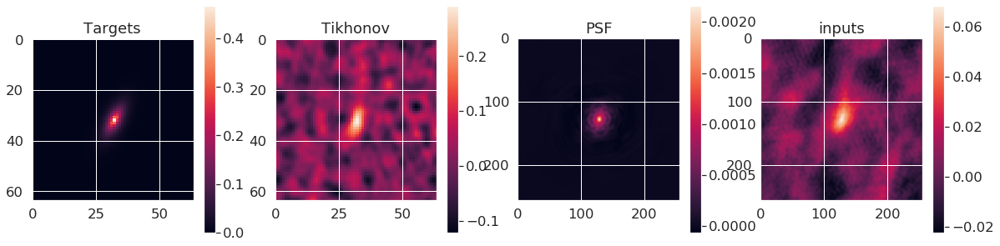

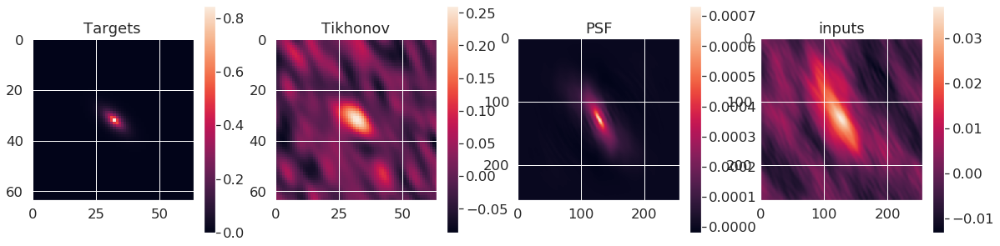

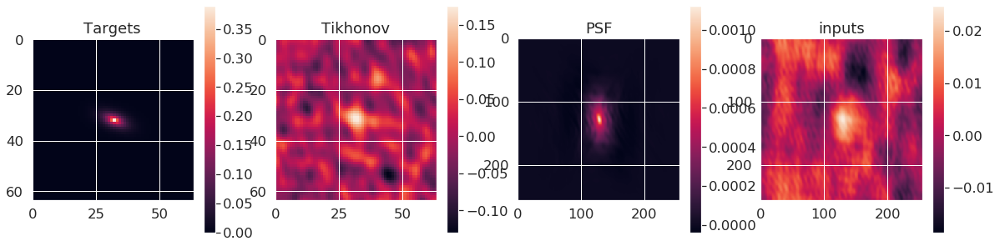

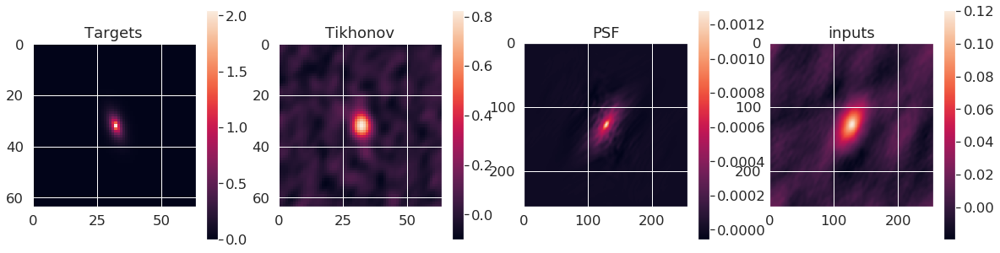

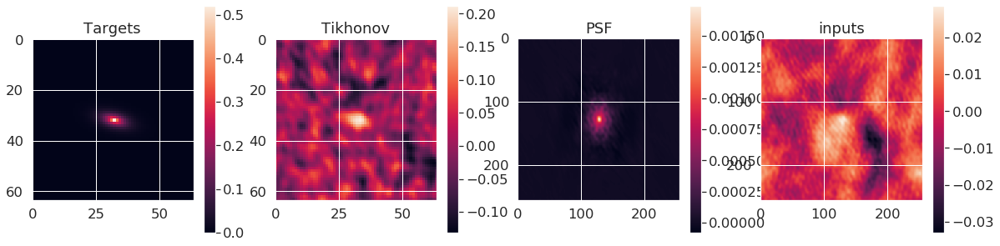

In [5]:
# set seaborn theme and style
sns.set_theme()
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

for i in range(5):#n_batch):
    plt.figure(33,figsize=(20,5))
    plt.subplot(141)
    plt.imshow(batch['targets'][i,...,0])
    plt.title('Targets')
    plt.colorbar()
    plt.subplot(142)
    plt.imshow(batch['inputs_tikho'][i,...,0])
    plt.title('Tikhonov')
    plt.colorbar()
    plt.subplot(143)
    plt.imshow(batch['psf'][i,0])
    plt.title('PSF')
    plt.colorbar()
    plt.subplot(144)
    plt.imshow(batch['inputs'][i,...,0])
    plt.title('inputs')
    plt.colorbar()
    plt.show()

## Load and Apply Trained Model on Batch

In [6]:
model_name_g0 = 'tikhonet_None-constraint_scales-4_steps-3125_epochs-10_growth_rate-12_batch_size-32_activationfunction-relu'
model_name_g01 = 'tikhonet_multi-constraint_scales-4_gamma-0.1_shearlet-3_steps-3125_epochs-10_growth_rate-12_batch_size-32_activationfunction-relu'
model_name_g05 = 'tikhonet_multi-constraint_scales-4_gamma-0.5_shearlet-3_steps-3125_epochs-10_growth_rate-12_batch_size-32_activationfunction-relu'
model_name_g1 = 'tikhonet_multi-constraint_scales-4_gamma-1.0_shearlet-3_steps-3125_epochs-10_growth_rate-12_batch_size-32_activationfunction-relu'
model_name_g2 = 'tikhonet_multi-constraint_scales-4_gamma-2.0_shearlet-3_steps-3125_epochs-10_growth_rate-12_batch_size-32_activationfunction-relu'
model_name_g10 = 'tikhonet_multi-constraint_scales-4_gamma-10.0_shearlet-3_steps-3125_epochs-10_growth_rate-12_batch_size-32_activationfunction-relu'


model_g0 = tf.keras.models.load_model(model_dir+model_name_g0, compile=False)
model_g01 = tf.keras.models.load_model(model_dir+model_name_g01, compile=False)
model_g05 = tf.keras.models.load_model(model_dir+model_name_g05, compile=False)
model_g1 = tf.keras.models.load_model(model_dir+model_name_g1, compile=False)
model_g2 = tf.keras.models.load_model(model_dir+model_name_g2, compile=False)
model_g10 = tf.keras.models.load_model(model_dir+model_name_g10, compile=False)

res_g0 = model_g0(batch['inputs_tikho'])
res_g01 = model_g01(batch['inputs_tikho'])
res_g05 = model_g05(batch['inputs_tikho'])
res_g1 = model_g1(batch['inputs_tikho'])
res_g2 = model_g2(batch['inputs_tikho'])
res_g10 = model_g10(batch['inputs_tikho'])

res_g0 = tf.keras.backend.eval(res_g0)[...,0]
res_g01 = tf.keras.backend.eval(res_g01)[...,0]
res_g05 = tf.keras.backend.eval(res_g05)[...,0]
res_g1 = tf.keras.backend.eval(res_g1)[...,0]
res_g2 = tf.keras.backend.eval(res_g2)[...,0]
res_g10 = tf.keras.backend.eval(res_g10)[...,0]

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [7]:
for key in ['inputs', 'inputs_tikho', 'targets']:
    batch[key] = batch[key][...,0]

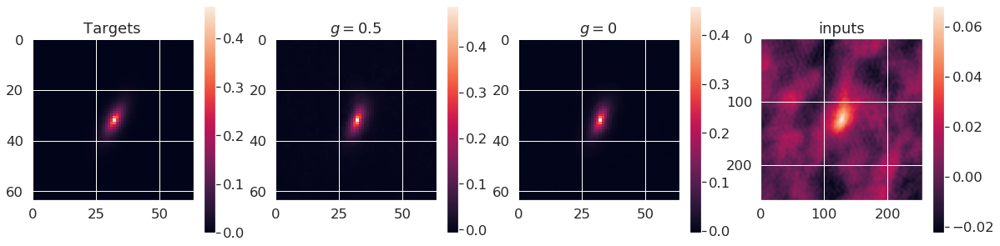

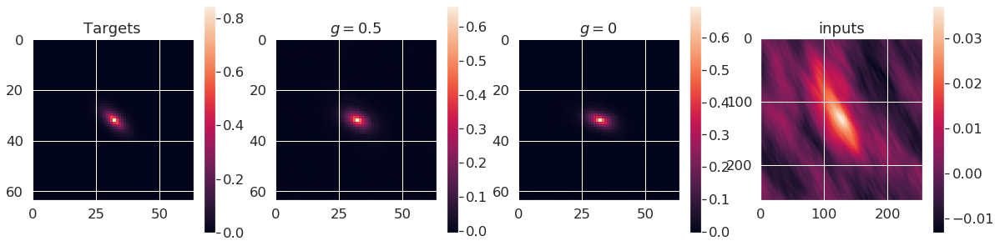

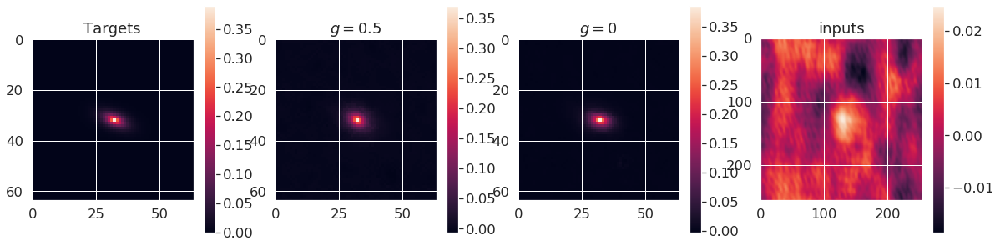

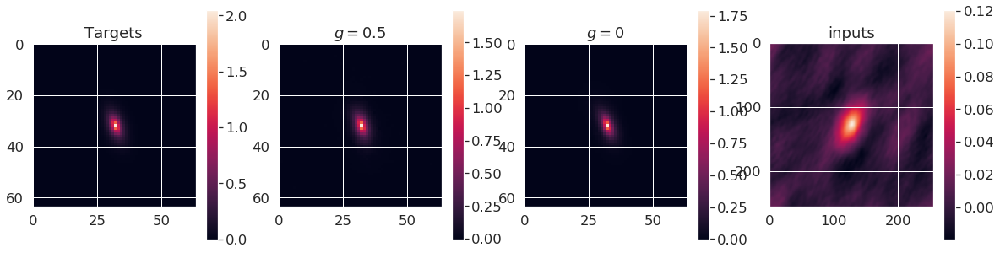

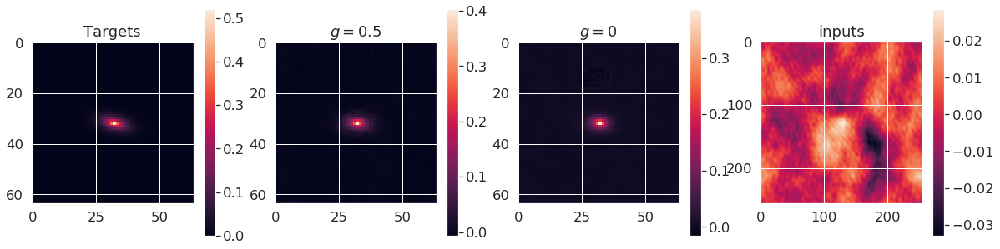

...

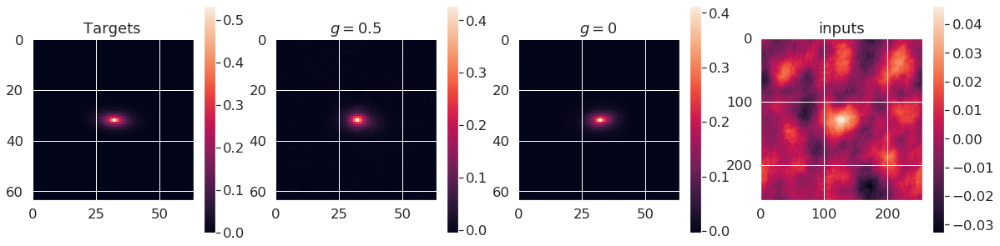

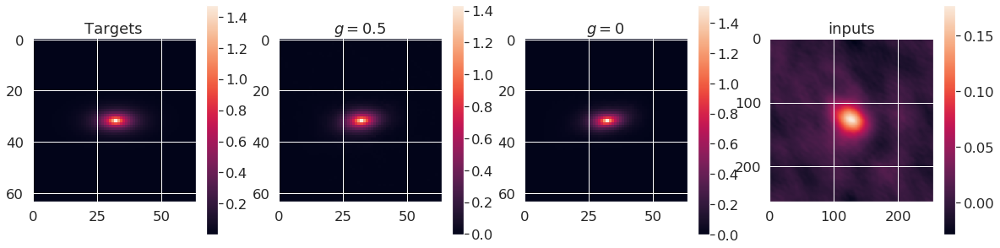

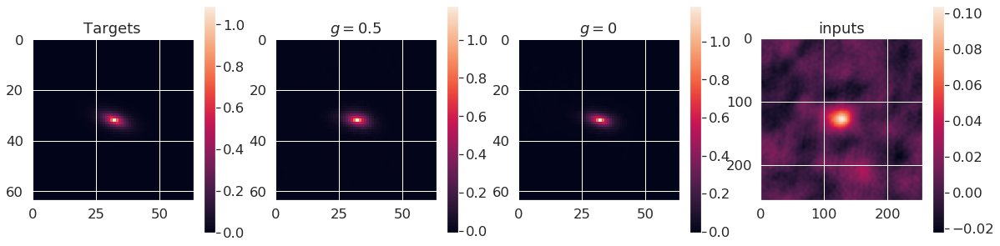

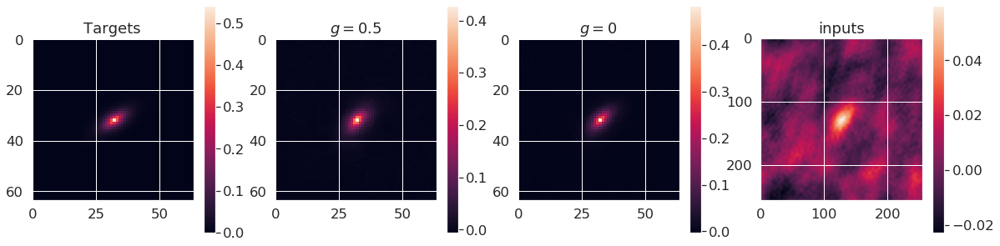

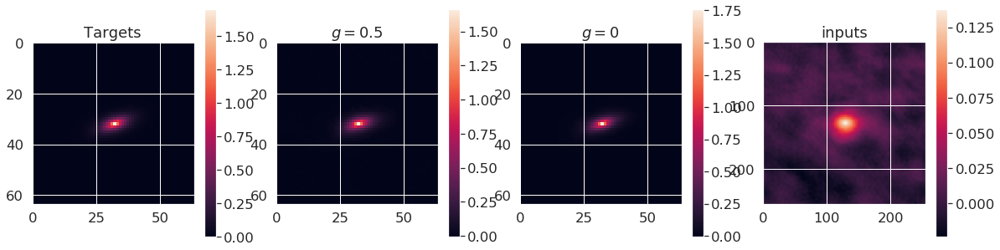

In [8]:
for i in range(n_batch):
    plt.figure(33,figsize=(20,5))
    plt.subplot(141)
    plt.imshow(batch['targets'][i])
    plt.title('Targets')
    plt.colorbar()
    plt.subplot(142)
    plt.imshow(res_g05[i])
    plt.title(r'$g=0.5$')
    plt.colorbar()
    plt.subplot(143)
    plt.imshow(res_g0[i])
    plt.title(r'$g=0$')
    plt.colorbar()
    plt.subplot(144)
    plt.imshow(batch['inputs'][i])
    plt.title('inputs')
    plt.colorbar()
    plt.show()

In [9]:
U = cl.makeUi(*batch['inputs_tikho'].shape[1:3])
im_size = 64
scale = 1.5

def relative_mse(solution, ground_truth):
    relative_mse = ((solution-ground_truth)**2).mean()/ \
                         (ground_truth**2).mean()
    return relative_mse
def MSE(X1,X2,norm=False):
    #Computes the relative MSE
    temp = 1
    if norm:
        temp = np.mean(X2**2)
    return np.mean((X1-X2)**2)/temp

def MSE_obj(obj1,obj2,norm=False):
    return np.array([MSE(o1,o2,norm) for o1,o2 in zip(obj1,obj2)])

def EllipticalGaussian(e1, e2, sig, xc=im_size//2, yc=im_size//2, stamp_size=(im_size,im_size)):
    # compute centered grid
    ranges = np.array([np.arange(i) for i in stamp_size])
    x = np.outer(ranges[0] - xc, np.ones(stamp_size[1]))
    y = np.outer(np.ones(stamp_size[0]),ranges[1] - yc)
    # shift it to match centroid
    xx = (1-e1/2)*x - e2/2*y
    yy = (1+e1/2)*y - e2/2*x
    # compute elliptical gaussian
    return np.exp(-(xx ** 2 + yy ** 2) / (2 * sig ** 2))

def get_moments(images, bool_window=False):
    g_list,error_flag_list=[],[]
    if bool_window:
        window_list = []
        window_flag_list = []
    for image in images:
        error_flag = True
        #create a galsim version of the data
        image_galsim = galsim.Image(image,scale=scale)
        #estimate the moments of the observation image
        shape = galsim.hsm.FindAdaptiveMom(image_galsim
                                         ,guess_centroid=galsim.PositionD(im_size//2,im_size//2)
                                         ,strict=False)
        if bool_window:
            k_sigma = 1.2 #scale up the size of the Gaussian window to make it able to capture more useful signal
            window = EllipticalGaussian(-1.*shape.observed_shape.e1, shape.observed_shape.e2 #convention fix:
                                                                                             #e1 sign swap
                                 ,shape.moments_sigma*k_sigma # convention fix: swap x and y and origin at (0,0)
                                 ,shape.moments_centroid.y-1, shape.moments_centroid.x-1
                                 ,image.shape)
            window_flag = bool(shape.moments_status+1)
        g = np.array([shape.observed_shape.g1, shape.observed_shape.g2])
        if shape.error_message:# or np.linalg.norm(shape.corrected_g1+shape.corrected_g2*1j)>1:
            error_flag = False
        error_flag_list += [error_flag]
        g_list += [g]
        if bool_window:
            window_list += [window]
            window_flag_list += [window_flag]
    output = [np.array(g_list).T,np.array(error_flag_list)]
    if bool_window:
        output += [np.array([window_list])[0],np.array([window_flag_list])[0]]
    return output

In [10]:
# compute pixel errors
mse_g0 = np.array([MSE_obj(true,est) for true,est in zip(batch['targets'], res_g0)])
mse_g01 = np.array([MSE_obj(true,est) for true,est in zip(batch['targets'], res_g01)])
mse_g05 = np.array([MSE_obj(true,est) for true,est in zip(batch['targets'], res_g05)])
mse_g1 = np.array([MSE_obj(true,est) for true,est in zip(batch['targets'], res_g1)])
mse_g2 = np.array([MSE_obj(true,est) for true,est in zip(batch['targets'], res_g2)])
mse_g10 = np.array([MSE_obj(true,est) for true,est in zip(batch['targets'], res_g10)])

# compute relative pixel errors
mse_g0_rel = np.array([relative_mse(true,est) for true,est in zip(batch['targets'], res_g0)])
mse_g01_rel = np.array([relative_mse(true,est) for true,est in zip(batch['targets'], res_g01)])
mse_g05_rel = np.array([relative_mse(true,est) for true,est in zip(batch['targets'], res_g05)])
mse_g1_rel = np.array([relative_mse(true,est) for true,est in zip(batch['targets'], res_g1)])
mse_g2_rel = np.array([relative_mse(true,est) for true,est in zip(batch['targets'], res_g2)])
mse_g10_rel = np.array([relative_mse(true,est) for true,est in zip(batch['targets'], res_g10)])

# estimate moments
mom_g0,_ = get_moments(res_g0)
mom_g01,_ = get_moments(res_g01)
mom_g05,_ = get_moments(res_g05)
mom_g1,_ = get_moments(res_g1)
mom_g2,_ = get_moments(res_g2)
mom_g10,_ = get_moments(res_g10)
mom_true,_,windows, window_flags = get_moments(batch['targets'],bool_window=True)

In [11]:
# compute adapative moments errors
mom_err_g0 = mom_g0-mom_true
mom_err_g01 = mom_g01-mom_true
mom_err_g05 = mom_g05-mom_true
mom_err_g1 = mom_g1-mom_true
mom_err_g2 = mom_g2-mom_true
mom_err_g10 = mom_g10-mom_true

In [12]:
sigma = 7e-4

# MAKING SNR BINS
# Binning parameters
n_bins = 4
snr = np.array([np.max(gal) / sigma for gal in batch['inputs']])

# BEGIN BINNING
# Partition galaxies into bins of equal size
# Initialize lower bound
lower_bound = np.min(snr)
ind_list = []
bins = []
sqrt_num_gal = []

for i in range(n_bins-1):
    # compute quantile that is used as an upper bound
    q = np.quantile(snr,(i+1)/n_bins)
    # retrieve galaxy indices which magnitude are between the bounds
    cond = np.logical_and(lower_bound<=snr,snr<q)
    ind = np.arange(cond.size)[cond]
    sqrt_num_gal += [np.sqrt(cond.sum())]
    # retrieve corresponding objects
    snr_q = snr[ind]
    ind_list += [ind]
    print(i+1, q, np.mean(snr_q))
    bins += [np.mean(snr_q)]
    # update lower bound
    lower_bound = q
# retrieve last bin indices
cond = lower_bound<=snr
ind = np.arange(cond.size)[cond]
# retrieve corresponding objects
snr_q = snr[ind]
ind_list += [ind]
sqrt_num_gal += [np.sqrt(cond.sum())]
bins += [np.mean(snr_q)]
print(i+2, q, np.mean(snr_q))

# END BINNING

1 68.26410336153847 43.857014388777316
2 116.86076010976518 92.70415657998197
3 197.61675170489718 150.62299290938034
4 197.61675170489718 335.0410018382328


In [13]:
# computing mean and standard deviation of relative mse error per binned SNR

mse_mean_g0 = []
mse_mean_g01 = []
mse_mean_g05 = []
mse_mean_g1 = []
mse_mean_g2 = []
mse_mean_g10 = []

mse_std_g0 = []
mse_std_g01 = []
mse_std_g05 = []
mse_std_g1 = []
mse_std_g2 = []
mse_std_g10 = []

mse_mean_g0_rel = []
mse_mean_g01_rel = []
mse_mean_g05_rel = []
mse_mean_g1_rel = []
mse_mean_g2_rel = []
mse_mean_g10_rel = []

mse_std_g0_rel = []
mse_std_g01_rel = []
mse_std_g05_rel = []
mse_std_g1_rel = []
mse_std_g2_rel = []
mse_std_g10_rel = []

# computing mean and standard deviation of adapative moments error per binned SNR

mom_mean_g0 = []
mom_mean_g01 = []
mom_mean_g05 = []
mom_mean_g1 = []
mom_mean_g2 = []
mom_mean_g10 = []

mom_median_g0 = []
mom_median_g01 = []
mom_median_g05 = []
mom_median_g1 = []
mom_median_g2 = []
mom_median_g10 = []

mom_std_g0 = []
mom_std_g01 = []
mom_std_g05 = []
mom_std_g1 = []
mom_std_g2 = []
mom_std_g10 = []

for ind in ind_list:
    
    mse_mean_g0 += [np.mean(mse_g0[ind])]
    mse_mean_g01 += [np.mean(mse_g01[ind])]
    mse_mean_g05 += [np.mean(mse_g05[ind])]
    mse_mean_g1 += [np.mean(mse_g1[ind])]
    mse_mean_g2 += [np.mean(mse_g2[ind])]
    mse_mean_g10 += [np.mean(mse_g10[ind])]

    mse_std_g0 += [np.std(mse_g0[ind])]
    mse_std_g01 += [np.std(mse_g01[ind])]
    mse_std_g05 += [np.std(mse_g05[ind])]
    mse_std_g1 += [np.std(mse_g1[ind])]
    mse_std_g2 += [np.std(mse_g2[ind])]
    mse_std_g10 += [np.std(mse_g10[ind])]
    
    mse_mean_g0_rel += [np.mean(mse_g0_rel[ind])]
    mse_mean_g01_rel += [np.mean(mse_g01_rel[ind])]
    mse_mean_g05_rel += [np.mean(mse_g05_rel[ind])]
    mse_mean_g1_rel += [np.mean(mse_g1_rel[ind])]
    mse_mean_g2_rel += [np.mean(mse_g2_rel[ind])]
    mse_mean_g10_rel += [np.mean(mse_g10_rel[ind])]

    mse_std_g0_rel += [np.std(mse_g0_rel[ind])]
    mse_std_g01_rel += [np.std(mse_g01_rel[ind])]
    mse_std_g05_rel += [np.std(mse_g05_rel[ind])]
    mse_std_g1_rel += [np.std(mse_g1_rel[ind])]
    mse_std_g2_rel += [np.std(mse_g2_rel[ind])]
    mse_std_g10_rel += [np.std(mse_g10_rel[ind])]
    
    mom_mean_g0 += [np.mean(np.abs(mom_err_g0[:,ind]),axis=1)]
    mom_mean_g01 += [np.mean(np.abs(mom_err_g01[:,ind]),axis=1)]
    mom_mean_g05 += [np.mean(np.abs(mom_err_g05[:,ind]),axis=1)]
    mom_mean_g1 += [np.mean(np.abs(mom_err_g1[:,ind]),axis=1)]
    mom_mean_g2 += [np.mean(np.abs(mom_err_g2[:,ind]),axis=1)]
    mom_mean_g10 += [np.mean(np.abs(mom_err_g10[:,ind]),axis=1)]
    
    mom_median_g0 += [np.median(np.abs(mom_err_g0[:,ind]),axis=1)]
    mom_median_g01 += [np.median(np.abs(mom_err_g01[:,ind]),axis=1)]
    mom_median_g05 += [np.median(np.abs(mom_err_g05[:,ind]),axis=1)]
    mom_median_g1 += [np.median(np.abs(mom_err_g1[:,ind]),axis=1)]
    mom_median_g2 += [np.median(np.abs(mom_err_g2[:,ind]),axis=1)]
    mom_median_g10 += [np.median(np.abs(mom_err_g10[:,ind]),axis=1)]

    mom_std_g0 += [np.std(np.abs(mom_err_g0[:,ind]),axis=1)]
    mom_std_g01 += [np.std(np.abs(mom_err_g01[:,ind]),axis=1)]
    mom_std_g05 += [np.std(np.abs(mom_err_g05[:,ind]),axis=1)]
    mom_std_g1 += [np.std(np.abs(mom_err_g1[:,ind]),axis=1)]
    mom_std_g2 += [np.std(np.abs(mom_err_g2[:,ind]),axis=1)]
    mom_std_g10 += [np.std(np.abs(mom_err_g10[:,ind]),axis=1)]
    
# Convert to numpy array with shape (2, n_bins)

mse_mean_g0 = np.array(mse_mean_g0).T
mse_mean_g01 = np.array(mse_mean_g01).T
mse_mean_g05 = np.array(mse_mean_g05).T
mse_mean_g1 = np.array(mse_mean_g1).T
mse_mean_g2 = np.array(mse_mean_g2).T
mse_mean_g10 = np.array(mse_mean_g10).T

mse_std_g0 = np.array(mse_std_g0).T
mse_std_g01 = np.array(mse_std_g01).T
mse_std_g05 = np.array(mse_std_g05).T
mse_std_g1 = np.array(mse_std_g1).T
mse_std_g2 = np.array(mse_std_g2).T
mse_std_g10 = np.array(mse_std_g10).T

mse_mean_g0_rel = np.array(mse_mean_g0_rel).T
mse_mean_g01_rel = np.array(mse_mean_g01_rel).T
mse_mean_g05_rel = np.array(mse_mean_g05_rel).T
mse_mean_g1_rel = np.array(mse_mean_g1_rel).T
mse_mean_g2_rel = np.array(mse_mean_g2_rel).T
mse_mean_g10_rel = np.array(mse_mean_g10_rel).T

mse_std_g0_rel = np.array(mse_std_g0_rel).T
mse_std_g01_rel = np.array(mse_std_g01_rel).T
mse_std_g05_rel = np.array(mse_std_g05_rel).T
mse_std_g1_rel = np.array(mse_std_g1_rel).T
mse_std_g2_rel = np.array(mse_std_g2_rel).T
mse_std_g10_rel = np.array(mse_std_g10_rel).T

mom_mean_g0 = np.array(mom_mean_g0).T
mom_mean_g01 = np.array(mom_mean_g01).T
mom_mean_g05 = np.array(mom_mean_g05).T
mom_mean_g1 = np.array(mom_mean_g1).T
mom_mean_g2 = np.array(mom_mean_g2).T
mom_mean_g10 = np.array(mom_mean_g10).T

mom_median_g0 = np.array(mom_median_g0).T
mom_median_g01 = np.array(mom_median_g01).T
mom_median_g05 = np.array(mom_median_g05).T
mom_median_g1 = np.array(mom_median_g1).T
mom_median_g2 = np.array(mom_median_g2).T
mom_median_g10 = np.array(mom_median_g10).T

mom_std_g0 = np.array(mom_std_g0).T
mom_std_g01 = np.array(mom_std_g01).T
mom_std_g05 = np.array(mom_std_g05).T
mom_std_g1 = np.array(mom_std_g1).T
mom_std_g2 = np.array(mom_std_g2).T
mom_std_g10 = np.array(mom_std_g10).T

/gpfslocalsup/pub/anaconda-py3/2019.10/envs/tensorflow-gpu-1.15.2/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


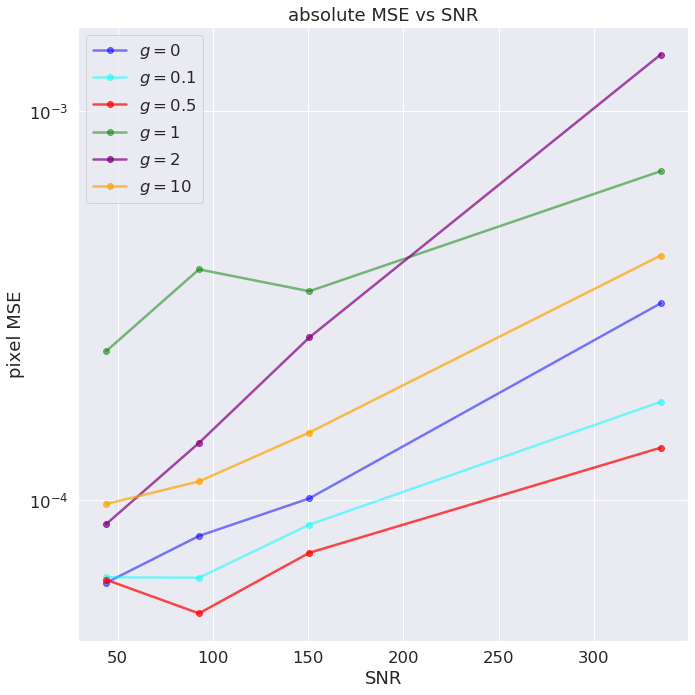

/gpfslocalsup/pub/anaconda-py3/2019.10/envs/tensorflow-gpu-1.15.2/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


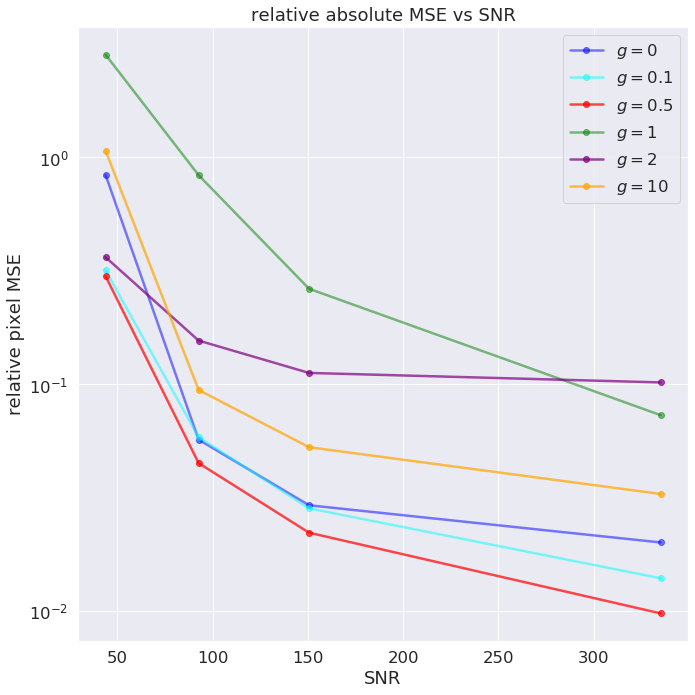

In [14]:
color_g0 = 'blue'
color_g01 = 'cyan'
color_g05 = 'red'
color_g1 = 'green'
color_g2 = 'purple'
color_g10 = 'orange'

label_g0 = r'$g=0$'
label_g01 = r'$g=0.1$'
label_g05 = r'$g=0.5$'
label_g1 = r'$g=1$'
label_g2 = r'$g=2$'
label_g10 = r'$g=10$'

plt.figure(figsize=(10,10))
# plt.errorbar(bins,mse_mean_g0,mse_std_g0/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
# plt.errorbar(bins,mse_mean_g01,mse_std_g01/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
# plt.errorbar(bins,mse_mean_g05,mse_std_g05/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
# plt.errorbar(bins,mse_mean_g1,mse_std_g1/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
# plt.errorbar(bins,mse_mean_g2,mse_std_g2/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
# plt.errorbar(bins,mse_mean_g10,mse_std_g10/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.semilogy(bins,mse_mean_g0,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.semilogy(bins,mse_mean_g01,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.semilogy(bins,mse_mean_g05,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.semilogy(bins,mse_mean_g1,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.semilogy(bins,mse_mean_g2,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.semilogy(bins,mse_mean_g10,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ylim(bottom=0)
#plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'pixel MSE')
plt.title(r'absolute MSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,10))
# plt.errorbar(bins,mse_mean_g0_rel,mse_std_g0_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
# plt.errorbar(bins,mse_mean_g01_rel,mse_std_g01_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
# plt.errorbar(bins,mse_mean_g05_rel,mse_std_g05_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
# plt.errorbar(bins,mse_mean_g1_rel,mse_std_g1_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
# plt.errorbar(bins,mse_mean_g2_rel,mse_std_g2_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
# plt.errorbar(bins,mse_mean_g10_rel,mse_std_g10_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.semilogy(bins,mse_mean_g0_rel,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.semilogy(bins,mse_mean_g01_rel,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.semilogy(bins,mse_mean_g05_rel,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.semilogy(bins,mse_mean_g1_rel,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.semilogy(bins,mse_mean_g2_rel,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.semilogy(bins,mse_mean_g10_rel,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ylim(bottom=0)
#plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'relative pixel MSE')
plt.title(r'relative absolute MSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

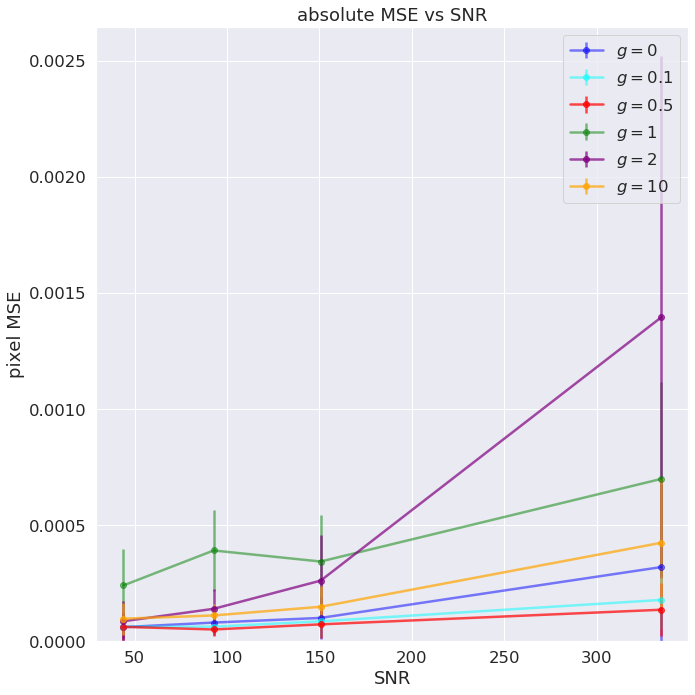

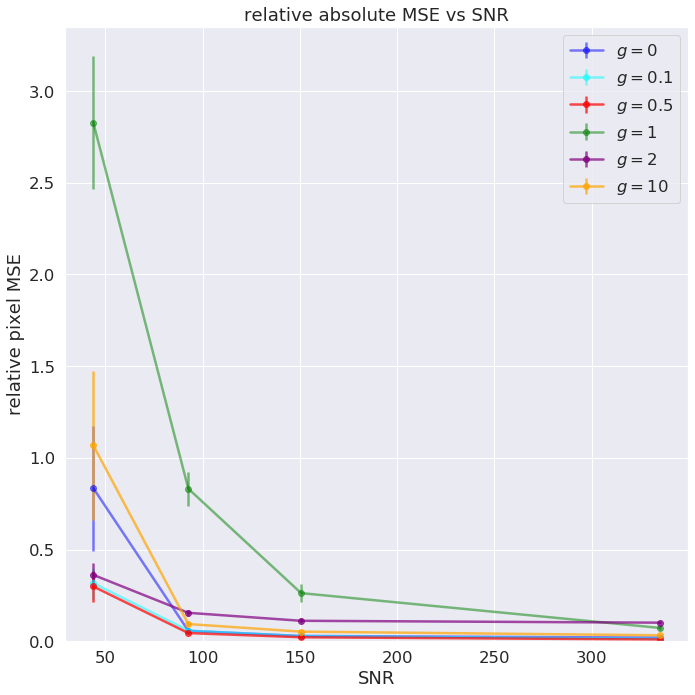

In [15]:
plt.figure(figsize=(10,10))
plt.errorbar(bins,mse_mean_g0,mse_std_g0/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.errorbar(bins,mse_mean_g01,mse_std_g01/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.errorbar(bins,mse_mean_g05,mse_std_g05/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.errorbar(bins,mse_mean_g1,mse_std_g1/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.errorbar(bins,mse_mean_g2,mse_std_g2/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.errorbar(bins,mse_mean_g10,mse_std_g10/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
# plt.semilogy(bins,mse_mean_g0,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
# plt.semilogy(bins,mse_mean_g01,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
# plt.semilogy(bins,mse_mean_g05,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
# plt.semilogy(bins,mse_mean_g1,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
# plt.semilogy(bins,mse_mean_g2,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
# plt.semilogy(bins,mse_mean_g10,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ylim(bottom=0)
#plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'pixel MSE')
plt.title(r'absolute MSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,10))
plt.errorbar(bins,mse_mean_g0_rel,mse_std_g0_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.errorbar(bins,mse_mean_g01_rel,mse_std_g01_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.errorbar(bins,mse_mean_g05_rel,mse_std_g05_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.errorbar(bins,mse_mean_g1_rel,mse_std_g1_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.errorbar(bins,mse_mean_g2_rel,mse_std_g2_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.errorbar(bins,mse_mean_g10_rel,mse_std_g10_rel/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
# plt.semilogy(bins,mse_mean_g0_rel,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
# plt.semilogy(bins,mse_mean_g01_rel,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
# plt.semilogy(bins,mse_mean_g05_rel,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
# plt.semilogy(bins,mse_mean_g1_rel,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
# plt.semilogy(bins,mse_mean_g2_rel,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
# plt.semilogy(bins,mse_mean_g10_rel,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ylim(bottom=0)
#plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'relative pixel MSE')
plt.title(r'relative absolute MSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

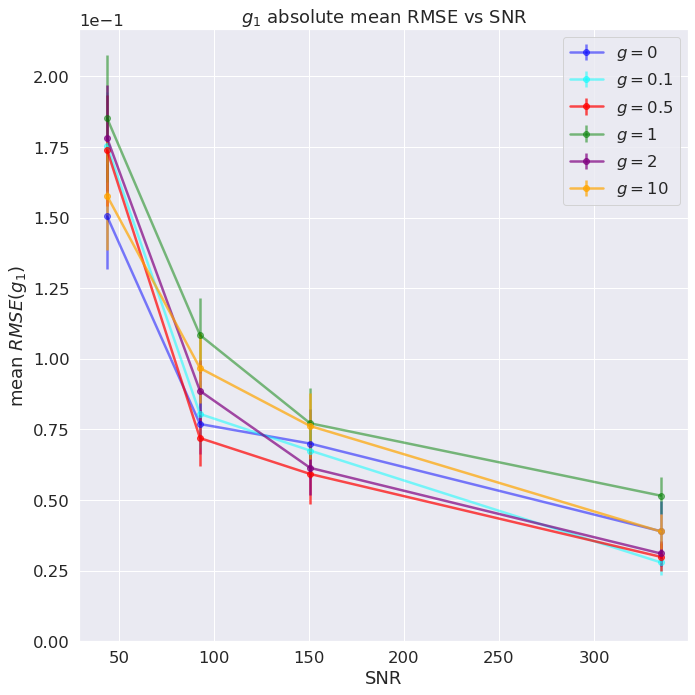

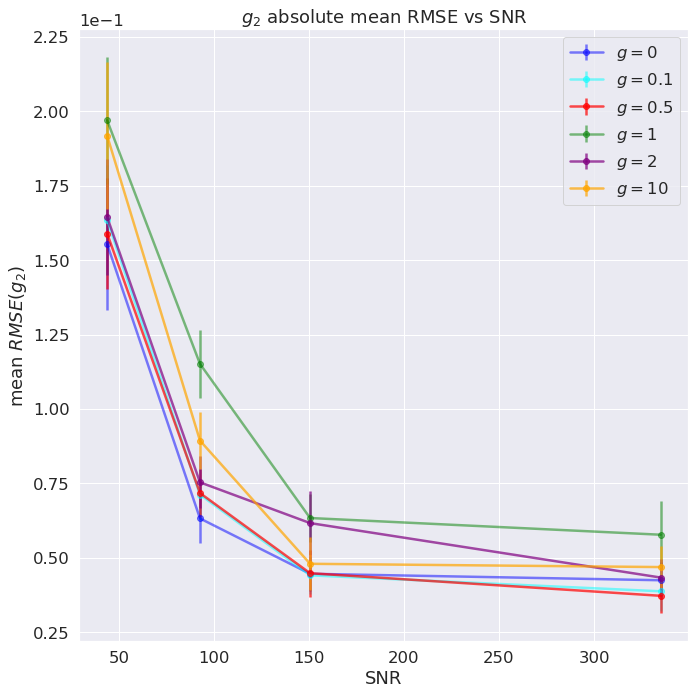

In [16]:
plt.figure(figsize=(10,10))
plt.errorbar(bins,mom_mean_g0[0],mom_std_g0[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.errorbar(bins,mom_mean_g01[0],mom_std_g01[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.errorbar(bins,mom_mean_g05[0],mom_std_g05[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.errorbar(bins,mom_mean_g1[0],mom_std_g1[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.errorbar(bins,mom_mean_g2[0],mom_std_g2[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.errorbar(bins,mom_mean_g10[0],mom_std_g10[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ylim(bottom=0)
plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'mean $RMSE(g_{1})$')
plt.title(r'$g_1$ absolute mean RMSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,10))
plt.errorbar(bins,mom_mean_g0[1],mom_std_g0[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.errorbar(bins,mom_mean_g01[1],mom_std_g01[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.errorbar(bins,mom_mean_g05[1],mom_std_g05[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.errorbar(bins,mom_mean_g1[1],mom_std_g1[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.errorbar(bins,mom_mean_g2[1],mom_std_g2[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.errorbar(bins,mom_mean_g10[1],mom_std_g10[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'mean $RMSE(g_2)$')
plt.title(r'$g_2$ absolute mean RMSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

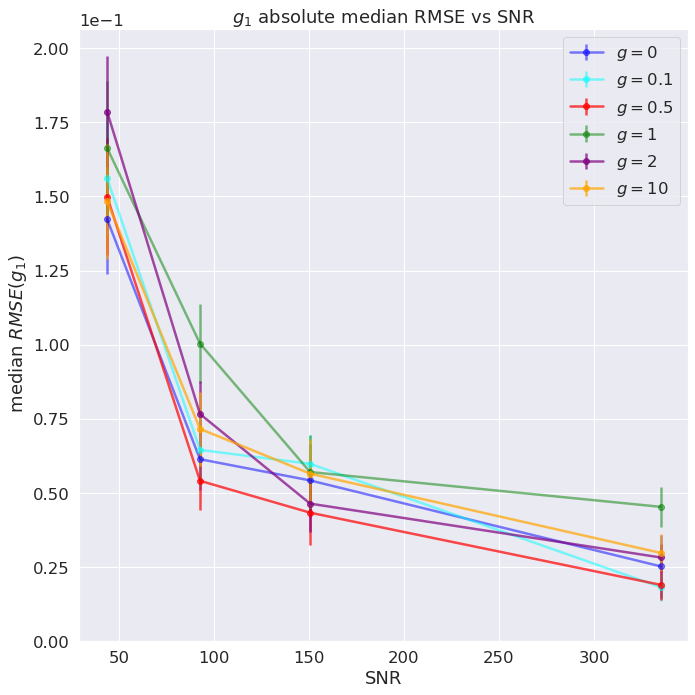

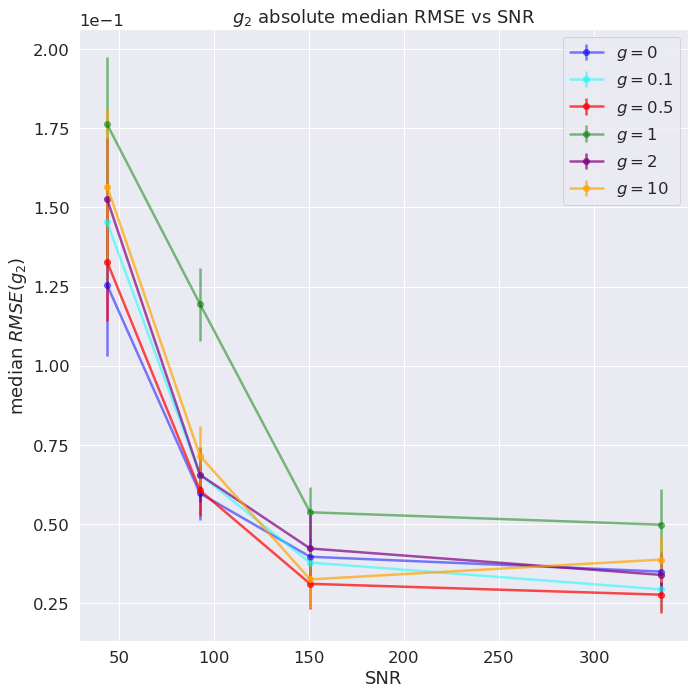

In [17]:
plt.figure(figsize=(10,10))
plt.errorbar(bins,mom_median_g0[0],mom_std_g0[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.errorbar(bins,mom_median_g01[0],mom_std_g01[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.errorbar(bins,mom_median_g05[0],mom_std_g05[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.errorbar(bins,mom_median_g1[0],mom_std_g1[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.errorbar(bins,mom_median_g2[0],mom_std_g2[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.errorbar(bins,mom_median_g10[0],mom_std_g10[0]/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ylim(bottom=0)
plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r' median $RMSE(g_{1})$')
plt.title(r'$g_1$ absolute median RMSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,10))
plt.errorbar(bins,mom_median_g0[1],mom_std_g0[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g0,label=label_g0,alpha=0.5)
plt.errorbar(bins,mom_median_g01[1],mom_std_g01[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g01,label=label_g01,alpha=0.5)
plt.errorbar(bins,mom_median_g05[1],mom_std_g05[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g05,label=label_g05,alpha=0.7)
plt.errorbar(bins,mom_median_g1[1],mom_std_g1[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g1,label=label_g1,alpha=0.5)
plt.errorbar(bins,mom_median_g2[1],mom_std_g2[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g2,label=label_g2,alpha=0.7)
plt.errorbar(bins,mom_median_g10[1],mom_std_g10[1]/sqrt_num_gal,linestyle='-', marker='o',color=color_g10,label=label_g10,alpha=0.7)
plt.ticklabel_format(axis='y', style='sci',scilimits=(0,0))
plt.xlabel(r'SNR')
plt.ylabel(r'median $RMSE(g_2)$')
plt.title(r'$g_2$ absolute median RMSE vs SNR')
plt.legend()
plt.tight_layout()
plt.show()

### Globally

In [18]:
# mean error on g0

np.mean(np.abs(mom_err_g0[0,:])),np.mean(np.abs(mom_err_g05[0,:]))

(0.08408433432628164, 0.0837452435042032)

In [19]:
# median error on g0

np.median(np.abs(mom_err_g0[0,:])),np.median(np.abs(mom_err_g05[0,:]))

(0.05581956738424021, 0.05481793795218123)

In [20]:
# mean error on g1

np.mean(np.abs(mom_err_g0[1,:])),np.mean(np.abs(mom_err_g05[1,:]))

(0.07642833473159286, 0.07818605673701598)

In [21]:
# median error on g1

np.median(np.abs(mom_err_g0[1,:])),np.median(np.abs(mom_err_g05[1,:]))

(0.052742766197382246, 0.053664513771919095)

In [22]:
np.mean(np.sum(np.abs(mom_err_g0),axis=0)),np.mean(np.sum(np.abs(mom_err_g05),axis=0))

(0.1605126690578745, 0.1619313002412192)

In [23]:
# mean error on g

np.mean(np.sqrt(np.sum(mom_err_g0**2,axis=0))),np.mean(np.sqrt(np.sum(mom_err_g05**2,axis=0)))

(0.12784888801633043, 0.125344975986263)

In [24]:
# standard erroe on mean error on g

np.std(np.sqrt(np.sum(mom_err_g0**2,axis=0)))/np.sqrt(128),np.std(np.sqrt(np.sum(mom_err_g05**2,axis=0)))/np.sqrt(128)

(0.009357186031810811, 0.009593743037546218)

In [25]:
np.mean(np.sqrt(np.sum(mom_err_g0**2,axis=0))) - np.mean(np.sqrt(np.sum(mom_err_g05**2,axis=0)))

0.002503912030067418

In [26]:
# median error on g

np.median(np.sqrt(np.sum(mom_err_g0**2,axis=0))), np.median(np.sqrt(np.sum(mom_err_g05**2,axis=0)))

(0.09228398634503557, 0.0858067250355459)

In [27]:
np.median(np.sqrt(np.sum(mom_err_g0**2,axis=0))) - np.median(np.sqrt(np.sum(mom_err_g05**2,axis=0)))

0.006477261309489668